In [1]:
import datashader as ds
import datashader.transfer_functions as tf
import datashader.glyphs
from datashader import reductions
from datashader.core import bypixel
from datashader.utils import lnglat_to_meters as webm, export_image
from datashader.colors import colormap_select, Greys9, viridis, inferno
import copy
import matplotlib.pyplot as plt

from pyproj import Proj, transform
import numpy as np
import pandas as pd
import urllib
import json
import datetime
import colorlover as cl

import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools

from shapely.geometry import Point, Polygon, shape
# In order to get shapley, you'll need to run [pip install shapely.geometry] from your terminal

from functools import partial

from IPython.display import GeoJSON

py.init_notebook_mode()

For module 2 we'll be looking at techniques for dealing with big data. In particular binning strategies and the datashader library (which possibly proves we'll never need to bin large data for visualization ever again.)

To demonstrate these concepts we'll be looking at the PLUTO dataset put out by New York City's department of city planning. PLUTO contains data about every tax lot in New York City.

PLUTO data can be downloaded from [here](https://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nyc_pluto_17v1_1.zip). Unzip them to the same directory as this notebook, and you should be able to read them in using this (or very similar) code. Also take note of the data dictionary, it'll come in handy for this assignment.

In [66]:
# Code to read in v17, column names have been updated (without upper case letters) for v18

bk = pd.read_csv('PLUTO17v1.1/BK2017V11.csv')
bx = pd.read_csv('PLUTO17v1.1/BX2017V11.csv')
mn = pd.read_csv('PLUTO17v1.1/MN2017V11.csv')
qn = pd.read_csv('PLUTO17v1.1/QN2017V11.csv')
si = pd.read_csv('PLUTO17v1.1/SI2017V11.csv')

ny = pd.concat([bk, bx, mn, qn, si], ignore_index=True)

#ny = pd.read_csv('nyc_pluto_18v2_csv/pluto_18v2.csv')


# Getting rid of some outliers
ny = ny[(ny['YearBuilt'] > 1850) & (ny['YearBuilt'] < 2020) & (ny['NumFloors'] != 0)]
# Getting rid of some outliers
# Getting rid of some outliers
ny = ny[(ny['YearBuilt'] > 1850) & (ny['YearBuilt'] < 2020) & (ny['NumFloors'] != 0)]


E:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning:

Columns (19,20,22,23,24,25,26,64,65,80) have mixed types. Specify dtype option on import or set low_memory=False.

E:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning:

Columns (19,20,22,23,64,65,80) have mixed types. Specify dtype option on import or set low_memory=False.

E:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning:

Columns (19,20,22,24,26) have mixed types. Specify dtype option on import or set low_memory=False.

E:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning:

Columns (19,20,22,23,64,65,77) have mixed types. Specify dtype option on import or set low_memory=False.

E:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning:

Columns (19,20,22,24,64,65,80) have mixed types. Specify dtype option on import or set low_memory=False.

E:\Anaconda\lib\site-packages\ipykernel_launche

I'll also do some prep for the geographic component of this data, which we'll be relying on for datashader.

You're not required to know how I'm retrieving the lattitude and longitude here, but for those interested: this dataset uses a flat x-y projection (assuming for a small enough area that the world is flat for easier calculations), and this needs to be projected back to traditional lattitude and longitude.

In [3]:

# Getting rid of some outliers
ny = ny[(ny['YearBuilt'] > 1850) & (ny['YearBuilt'] < 2020) & (ny['NumFloors'] != 0)]
# Getting rid of some outliers
# Getting rid of some outliers
ny = ny[(ny['YearBuilt'] > 1850) & (ny['YearBuilt'] < 2020) & (ny['NumFloors'] != 0)]

wgs84 = Proj("+proj=longlat +ellps=GRS80 +datum=NAD83 +no_defs")
nyli = Proj("+proj=lcc +lat_1=40.66666666666666 +lat_2=41.03333333333333 +lat_0=40.16666666666666 +lon_0=-74 +x_0=300000 +y_0=0 +ellps=GRS80 +datum=NAD83 +to_meter=0.3048006096012192 +no_defs")
ny['XCoord'] = 0.3048*ny['XCoord']
ny['YCoord'] = 0.3048*ny['YCoord']
ny['lon'], ny['lat'] = transform(nyli, wgs84, ny['XCoord'].values, ny['YCoord'].values)

ny = ny[(ny['lon'] < -60) & (ny['lon'] > -100) & (ny['lat'] < 60) & (ny['lat'] > 20)]

#Defining some helper functions for DataShader
background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

## Part 1: Binning and Aggregation

Binning is a common strategy for visualizing large datasets. Binning is inherent to a few types of visualizations, such as histograms and [2D histograms](https://plot.ly/python/2D-Histogram/) (also check out their close relatives: [2D density plots](https://plot.ly/python/2d-density-plots/) and the more general form: [heatmaps](https://plot.ly/python/heatmaps/).

While these visualization types explicitly include binning, any type of visualization used with aggregated data can be looked at in the same way. For example, lets say we wanted to look at building construction over time. This would be best viewed as a line graph, but we can still think of our results as being binned by year:

In [4]:
ny.groupby('YearBuilt').count()['LotArea'].index


Int64Index([1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860,
            ...
            2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017],
           dtype='int64', name='YearBuilt', length=167)

In [5]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = ny.groupby('YearBuilt').count()['BBL'].index,
    y = ny.groupby('YearBuilt').count()['BBL']
)

layout = go.Layout(
    xaxis = dict(title = 'Year Built'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.Figure(data = [trace], layout = layout)

py.iplot(fig)

Something looks off... You're going to have to deal with this imperfect data to answer this first question. 

But first: some notes on pandas. Pandas dataframes are a different beast than R dataframes, here are some tips to help you get up to speed:

---

Hello all, here are some pandas tips to help you guys through this homework:

[Indexing and Selecting](https://pandas.pydata.org/pandas-docs/stable/indexing.html): .loc and .iloc are the analogs for base R subsetting, or filter() in dplyr

[Group By](https://pandas.pydata.org/pandas-docs/stable/groupby.html):  This is the pandas analog to group_by() and the appended function the analog to summarize(). Try out a few examples of this, and display the results in Jupyter. Take note of what's happening to the indexes, you'll notice that they'll become hierarchical. I personally find this more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. Once you perform an aggregation, try running the resulting hierarchical datafrome through a [reset_index()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.reset_index.html).

[Reset_index](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.reset_index.html): I personally find the hierarchical indexes more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. reset_index() is a way of restoring a dataframe to a flatter index style. Grouping is where you'll notice it the most, but it's also useful when you filter data, and in a few other split-apply-combine workflows. With pandas indexes are more meaningful, so use this if you start getting unexpected results.

Indexes are more important in Pandas than in R. If you delve deeper into the using python for data science, you'll begin to see the benefits in many places (despite the personal gripes I highlighted above.) One place these indexes come in handy is with time series data. The pandas docs have a [huge section](http://pandas.pydata.org/pandas-docs/stable/timeseries.html) on datetime indexing. In particular, check out [resample](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html), which provides time series specific aggregation.

[Merging, joining, and concatenation](https://pandas.pydata.org/pandas-docs/stable/merging.html): There's some overlap between these different types of merges, so use this as your guide. Concat is a single function that replaces cbind and rbind in R, and the results are driven by the indexes. Read through these examples to get a feel on how these are performed, but you will have to manage your indexes when you're using these functions. Merges are fairly similar to merges in R, similarly mapping to SQL joins.

Apply: This is explained in the "group by" section linked above. These are your analogs to the plyr library in R. Take note of the lambda syntax used here, these are anonymous functions in python. Rather than predefining a custom function, you can just define it inline using lambda.

Browse through the other sections for some other specifics, in particular reshaping and categorical data (pandas' answer to factors.) Pandas can take a while to get used to, but it is a pretty strong framework that makes more advanced functions easier once you get used to it. Rolling functions for example follow logically from the apply workflow (and led to the best google results ever when I first tried to find this out and googled "pandas rolling")

Google Wes Mckinney's book "Python for Data Analysis," which is a cookbook style intro to pandas. It's an O'Reilly book that should be pretty available out there.

---

### Question

After a few building collapses, the City of New York is going to begin investigating older buildings for safety. The city is particularly worried about buildings that were unusually tall when they were built, since best-practices for safety hadn’t yet been determined. Create a graph that shows how many buildings of a certain number of floors were built in each year (note: you may want to use a log scale for the number of buildings). Find a strategy to bin buildings (It should be clear 20-29-story buildings, 30-39-story buildings, and 40-49-story buildings were first built in large numbers, but does it make sense to continue in this way as you get taller?)

In [65]:
ny.groupby('NumFloors').size().reset_index()[1:20]

,NumFloors,0
1,1.0,75847
2,2.0,533332
3,3.0,130699
4,4.0,27928
5,5.0,16554
6,6.0,12298
7,7.0,2191
8,8.0,1107
9,9.0,700
10,10.0,551


# First issue
+ Clearly the number of floors is actually non integer.  looking at the key, it appears they are entered as 6 digits
+ Considering we are looking at tall building, we definitely want to bin this as discrete integers.  The relative importance of height being measured by the foot rapidly decrases as we start looking at 100 ft and up buildings (10 stories)
+ Im just going to round all the floors

    


In [7]:
ny.NumFloors = ny.NumFloors.round()
rounded_floors =ny.groupby('NumFloors').size().reset_index()
rounded_floors.columns=["floors","count"]
#ny['YearBuilt'] = pd.to_datetime(ny['YearBuilt'])

In [8]:
rounded_floors[0:25]

,floors,count
0,0.0,2
1,1.0,76896
2,2.0,533818
3,3.0,133170
4,4.0,28838
5,5.0,16621
6,6.0,12311
7,7.0,2208
8,8.0,1118
9,9.0,700


In [9]:
#pre_1940 = ny[ny['YearBuilt']<1940]
#pre_1940.shape[0]-pre_1940.shape[0
#pre_1940["NumFloors"].count

## Plot it


In [10]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = rounded_floors["floors"],
    y = rounded_floors["count"]
)

layout = go.Layout(
    xaxis = dict(title = 'floors'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.Figure(data = [trace], layout = layout)

py.iplot(fig)

## Log transform graph 


In [11]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = rounded_floors["floors"],
    y = np.log10(rounded_floors["count"])
)

layout = go.Layout(
    xaxis = dict(title = 'floors',
                tickvals = [0, 10,20,30,40,50,60,70,80,90,100,110,120]),
    yaxis = dict(title = 'Number of Lots Built on log scale')
#                tickvals = [0, 10,100 ,1000,10000,100000])
    
)

fig = go.Figure(data = [trace], layout = layout)

#fig.update_yaxes(type="log")
py.iplot(fig)

## Buidling that were unusually tall
+ Lets look at distribution of buildings by height
+ I build out the distribution of buildings by looking at the quantiles that split the difference between 1 and the previous percentile( with some rounding and logic)
+ I use some logic assuming that while .95 would be a standard starting place for statistical significance, setting the standard to .99 seems like a better starting place (7 floors height 70 feet)
+ we do this for entire dataset, and 4 stories and up(95 percentile value in full dataset so "true outliers")
    

In [12]:
ny['NumFloors'].quantile([.25, .5, .75,.95,.975,.99,.995,.9975,.9987,.9994,.9997,.9999,.99995,.999975,.99999,.999995,.9999975])

0.250000      2.000000
0.500000      2.000000
0.750000      2.000000
0.950000      4.000000
0.975000      6.000000
0.990000      7.000000
0.995000     13.000000
0.997500     18.000000
0.998700     25.000000
0.999400     35.000000
0.999700     42.000000
0.999900     54.000000
0.999950     63.000000
0.999975     73.000000
0.999990     88.000000
0.999995     90.000000
0.999997    103.941095
Name: NumFloors, dtype: float64

In [13]:
outliers_only=ny[ny['NumFloors']>=4]
outliers_only['NumFloors'].quantile([.25, .5, .75,.95,.975,.99,.995,.9975,.9987,.9994,.9997,.9999,.99995,.999975,.99999,.999995,.9999975])

0.250000      4.000000
0.500000      5.000000
0.750000      6.000000
0.950000     14.000000
0.975000     20.000000
0.990000     31.000000
0.995000     39.000000
0.997500     46.000000
0.998700     53.000000
0.999400     63.000000
0.999700     73.000000
0.999900     88.000000
0.999950     97.263000
0.999975    107.026250
0.999990    115.605250
0.999995    117.302625
0.999997    118.151312
Name: NumFloors, dtype: float64

## Graph 4 stories and above

+ it's pretty obvious that unusually large for buildings in NYC, is a very small floor number 
+ If we wanted to explore buildings that were "unusually" large, anything 2 sd away should be a starting point.  
+ 4 floors is the 95th percentile( 2 sd) for our full dataset.  I will start with buildings 4 stories + 
+ we also want to counterbalance readability in the data, so we will try to make bins that have enough occurrences and make sense to display
+ Binning
    + 0-4
    + 4-10 stories
    + 11-20 stories 
    + 21-30 stories
    + 31-50 stories
    + 50-90  stories
    + 90 plus


## Create Bins

In [14]:
ny['age_bins'] = pd.cut(x=ny['NumFloors'], bins=[0,4,10,20,30,50,90,150], labels=['0-4', '5-10', '11-20',"21-30","31-50","51-90","90+"])
ny['age_bins'][1:25]


17      0-4
20      0-4
22     5-10
23    11-20
24      0-4
25     5-10
26      0-4
27      0-4
28     5-10
29     5-10
30      0-4
31      0-4
32      0-4
35     5-10
36      0-4
37      0-4
40      0-4
41      0-4
42     5-10
43      0-4
44      0-4
45     5-10
46    11-20
47     5-10
Name: age_bins, dtype: category
Categories (7, object): [0-4 < 5-10 < 11-20 < 21-30 < 31-50 < 51-90 < 90+]

In [15]:
summarized_by_year_group=ny.groupby(['YearBuilt', 'age_bins']).count().fillna(0)["ZoneMap"].reset_index()
summarized_by_year_group[1:10]


,YearBuilt,age_bins,ZoneMap
1,1851,5-10,1.0
2,1851,11-20,0.0
3,1851,21-30,0.0
4,1851,31-50,0.0
5,1851,51-90,0.0
6,1851,90+,0.0
7,1852,0-4,11.0
8,1852,5-10,3.0
9,1852,11-20,0.0


## Group by aggregate


In [16]:
counts = ny.groupby(['YearBuilt', 'age_bins']).count().fillna(0)["ZoneMap"]
print (counts[1:20])

YearBuilt  age_bins
1851       5-10         1.0
           11-20        0.0
           21-30        0.0
           31-50        0.0
           51-90        0.0
           90+          0.0
1852       0-4         11.0
           5-10         3.0
           11-20        0.0
           21-30        0.0
           31-50        0.0
           51-90        0.0
           90+          0.0
1853       0-4         10.0
           5-10         1.0
           11-20        1.0
           21-30        0.0
           31-50        0.0
           51-90        0.0
Name: ZoneMap, dtype: float64


## PLT Graph
+ turn data into columns
+ log transform summarized data 

In [33]:
counts1 = ny.groupby(['YearBuilt', 'age_bins']).count()["ZoneMap"]
counts1  =counts1.unstack(level=1)
counts= np.log10(counts1)
counts =counts.fillna(0)
print(counts[1:25])

age_bins        0-4      5-10  11-20  21-30  31-50  51-90  90+
YearBuilt                                                     
1852       1.041393  0.477121    0.0    0.0    0.0    0.0  0.0
1853       1.000000  0.000000    0.0    0.0    0.0    0.0  0.0
1854       0.778151  0.000000    0.0    0.0    0.0    0.0  0.0
1855       1.079181  0.000000    0.0    0.0    0.0    0.0  0.0
1856       0.954243  0.301030    0.0    0.0    0.0    0.0  0.0
1857       0.698970  0.477121    0.0    0.0    0.0    0.0  0.0
1858       0.778151  0.000000    0.0    0.0    0.0    0.0  0.0
1859       0.845098  0.301030    0.0    0.0    0.0    0.0  0.0
1860       1.462398  0.845098    0.0    0.0    0.0    0.0  0.0
1861       0.477121  0.000000    0.0    0.0    0.0    0.0  0.0
1862       0.000000  0.000000    0.0    0.0    0.0    0.0  0.0
1863       0.301030  0.000000    0.0    0.0    0.0    0.0  0.0
1864       0.301030  0.000000    0.0    0.0    0.0    0.0  0.0
1865       0.845098  0.000000    0.0    0.0    0.0    0

In [18]:
# plt.figure(figsize=(40,40))
# plt.bar((ny["YearBuilt"].unique()), counts['5-10'], bottom=None )
# plt.bar((ny["YearBuilt"].unique()), counts['11-20'], bottom=counts['5-10'] )
# plt.bar((ny["YearBuilt"].unique()), counts['21-30'], bottom= counts['11-20'])
# plt.bar((ny["YearBuilt"].unique()), counts['31-50'], bottom= counts['21-30'])
# plt.bar((ny["YearBuilt"].unique()), counts['51-90'], bottom= counts['31-50'])
# plt.bar((ny["YearBuilt"].unique()), counts['90+'], bottom= counts['51-90'])


# plt.legend()
# plt.xlabel('Ages')
# plt.ylabel('Count')

In [64]:


fig = go.Figure(data=[
    go.Bar(name='5 - 10 floors',  x=ny["YearBuilt"].unique(), y=counts['5-10'],text=counts1['5-10'], hoverinfo ='text'),
    go.Bar(name='10 - 20 floors', x=ny["YearBuilt"].unique(), y=counts['11-20'],text=counts1['11-20'], hoverinfo ='text'),
    go.Bar(name='21 - 30 floors', x=ny["YearBuilt"].unique(), y=counts['21-30'],text=counts1['21-30'], hoverinfo ='text'),
    go.Bar(name='31 - 50 floors', x=ny["YearBuilt"].unique(), y=counts['31-50'],text=counts1['31-50'], hoverinfo ='text'),
    go.Bar(name='51 - 90 floors', x=ny["YearBuilt"].unique(), y=counts['51-90'],text=counts1['51-90'], hoverinfo ='text'),
    go.Bar(name='90 + floors', x=ny["YearBuilt"].unique(), y=counts['90+'],hovertext=counts1['90+'])])

## Change the bar mode
fig.update_layout(barmode='stack',title=go.layout.Title(
        text="Buildings by height and year on log scale.<br>Hover displays non log counts",
        xref="paper",
        x=0))

fig.show()

## Part 2: Datashader

Datashader is a library from Anaconda that does away with the need for binning data. It takes in all of your datapoints, and based on the canvas and range returns a pixel-by-pixel calculations to come up with the best representation of the data. In short, this completely eliminates the need for binning your data.

As an example, lets continue with our question above and look at a 2D histogram of YearBuilt vs NumFloors:

In [20]:
yearbins = 200
floorbins = 200

yearBuiltCut = pd.cut(ny['YearBuilt'], np.linspace(ny['YearBuilt'].min(), ny['YearBuilt'].max(), yearbins))
numFloorsCut = pd.cut(ny['NumFloors'], np.logspace(1, np.log(ny['NumFloors'].max()), floorbins))

xlabels = np.floor(np.linspace(ny['YearBuilt'].min(), ny['YearBuilt'].max(), yearbins))
ylabels = np.floor(np.logspace(1, np.log(ny['NumFloors'].max()), floorbins))

data = [
    go.Heatmap(z = ny.groupby([numFloorsCut, yearBuiltCut])['BBL'].count().unstack().fillna(0).values,
              colorscale = 'Greens', x = xlabels, y = ylabels)
]

py.iplot(data)

This shows us the distribution, but it's subject to some biases discussed in the Anaconda notebook [Plotting Perils](https://anaconda.org/jbednar/plotting_pitfalls/notebook). 

Here is what the same plot would look like in datashader:



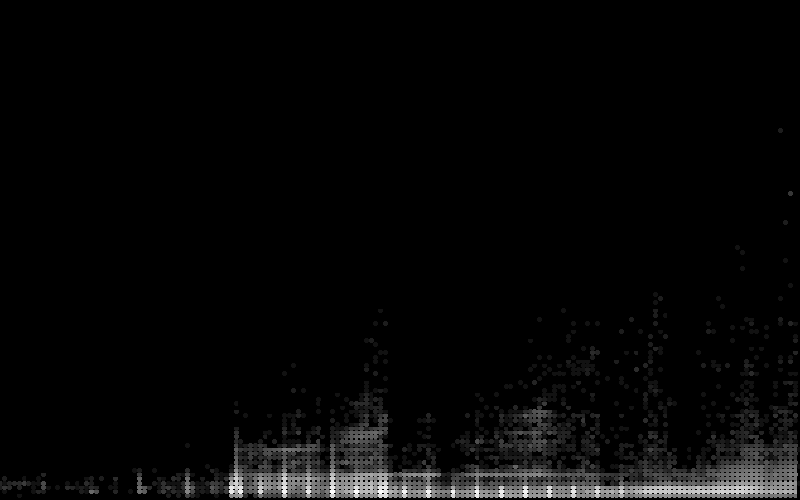

In [21]:
cvs = ds.Canvas(800, 500, x_range = (ny['YearBuilt'].min(), ny['YearBuilt'].max()), 
                                y_range = (ny['NumFloors'].min(), ny['NumFloors'].max()))
agg = cvs.points(ny, 'YearBuilt', 'NumFloors')
view = tf.shade(agg, cmap = cm(Greys9), how='log')
export(tf.spread(view, px=2), 'yearvsnumfloors')

That's technically just a scatterplot, but the points are smartly placed and colored to mimic what one gets in a heatmap. Based on the pixel size, it will either display individual points, or will color the points of denser regions.

Datashader really shines when looking at geographic information. Here are the latitudes and longitudes of our dataset plotted out, giving us a map of the city colored by density of structures:

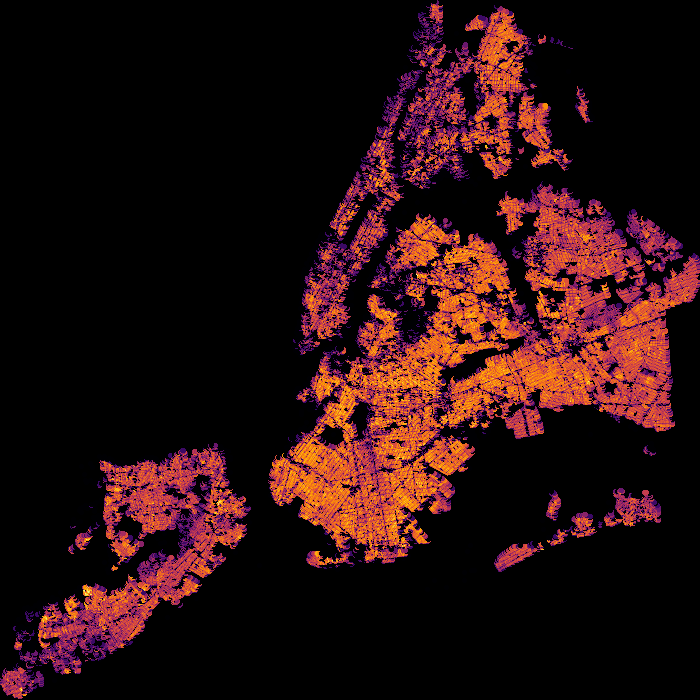

In [22]:
#NewYorkCity   = (( -74.29,  -73.69), (40.49, 40.92))
cvs = ds.Canvas(700, 700, )
agg = cvs.points(ny, 'lon', 'lat')
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')

Interestingly, since we're looking at structures, the large buildings of Manhattan show up as less dense on the map. The densest areas measured by number of lots would be single or multi family townhomes.

Unfortunately, Datashader doesn't have the best documentation. Browse through the examples from their [github repo](https://github.com/bokeh/datashader/tree/master/examples). I would focus on the [visualization pipeline](https://anaconda.org/jbednar/pipeline/notebook) and the [US Census](https://anaconda.org/jbednar/census/notebook) Example for the question below. Feel free to use my samples as templates as well when you work on this problem.

### Question

You work for a real estate developer and are researching underbuilt areas of the city. After looking in the [Pluto data dictionary](https://www1.nyc.gov/assets/planning/download/pdf/data-maps/open-data/pluto_datadictionary.pdf?v=17v1_1), you've discovered that all tax assessments consist of two parts: The assessment of the land and assessment of the structure. You reason that there should be a correlation between these two values: more valuable land will have more valuable structures on them (more valuable in this case refers not just to a mansion vs a bungalow, but an apartment tower vs a single family home). Deviations from the norm could represent underbuilt or overbuilt areas of the city. You also recently read a really cool blog post about [bivariate choropleth maps](http://www.joshuastevens.net/cartography/make-a-bivariate-choropleth-map/), and think the technique could be used for this problem.

Datashader is really cool, but it's not that great at labeling your visualization. Don't worry about providing a legend, but provide a quick explanation as to which areas of the city are overbuilt, which areas are underbuilt, and which areas are built in a way that's properly correlated with their land value.

## Finding some Predictors

In [23]:
filter_col = [col for col in ny if col.startswith("A")]
filter_col2 = [col for col in ny if col.startswith("T")]
filter_col2.append(filter_col)
filter_col2

['TaxMap',
 'Tract2010',
 ['APPBBL', 'APPDate', 'Address', 'AreaSource', 'AssessLand', 'AssessTot']]

## Two approaches
+ The data has an AccesTot, an accessLand, Units_total, and lot_area
+ One approach we can look at a predictor representing the land like(lot area) versus a predictor representing the potential usage of that lot(units built)
+ Second approach, we can assume that considering there are two parts to the tax assessment(AssessTot-AssessLand =AssessStructure).  We can also use the lot square footage to normalize the lot evaluation by sq ft
+ The second approach seems more accurate towards the direct question at hand.   


### Tax Assesment approach
+ We have a choice to make for the measurement.  In theory, we can look at the difference between land value/sq ft and structure value/sq ft.  However, I believe doing so ignores the relative nature of the difference between both.  Instead, I chose to measure the diff as the ratio of the assessed value of the structure versus the assessed value of the land

In [32]:

#ny['Assessstructure'] = (ny['Assessstructure']/ ny["BldgArea"] ) - (ny['AssessLand']/ny['LotArea'])
ny['Assessstructure'] = ny["AssessTot"]- ny['AssessLand']

## filter for less than 0
ny = ny[ny["BldgArea"]>0]
ny = ny[ny['LotArea']>0]

## catch weird cases
ny= ny[ny['Assessstructure']>1000 ]
ny= ny[ny['AssessLand']>1000 ]

## normalize by sqft
ny['Assessstructure_sqft'] = ny['Assessstructure']/ ny["BldgArea"]
ny['AssessLand_sqft'] = ny['AssessLand']/ ny["LotArea"]

## build ratio
my_ny = pd.DataFrame(ny[['AssessLand_sqft', 'Assessstructure_sqft', 'lat', 'lon']])
my_ny["diff"]= my_ny["Assessstructure_sqft"]/my_ny["AssessLand_sqft"]
my_ny[1:20]

,AssessLand_sqft,Assessstructure_sqft,lat,lon,diff
17,12.169014,23.098592,40.304246,-76.450233,1.898148
20,4.050000,11.700000,40.304382,-76.450632,2.888889
22,12.469091,34.397264,40.304261,-76.449839,2.758602
23,23.478261,80.017200,40.304258,-76.449557,3.408140
24,11.324189,59.026915,40.304225,-76.449291,5.212463
25,11.786276,62.133655,40.304310,-76.449296,5.271695
26,11.404255,34.163812,40.304291,-76.449081,2.995707
27,26.964286,53.828571,40.304289,-76.448917,1.996291
28,13.500000,53.704502,40.304209,-76.448965,3.978111
29,11.474035,104.435290,40.304250,-76.449189,9.101880


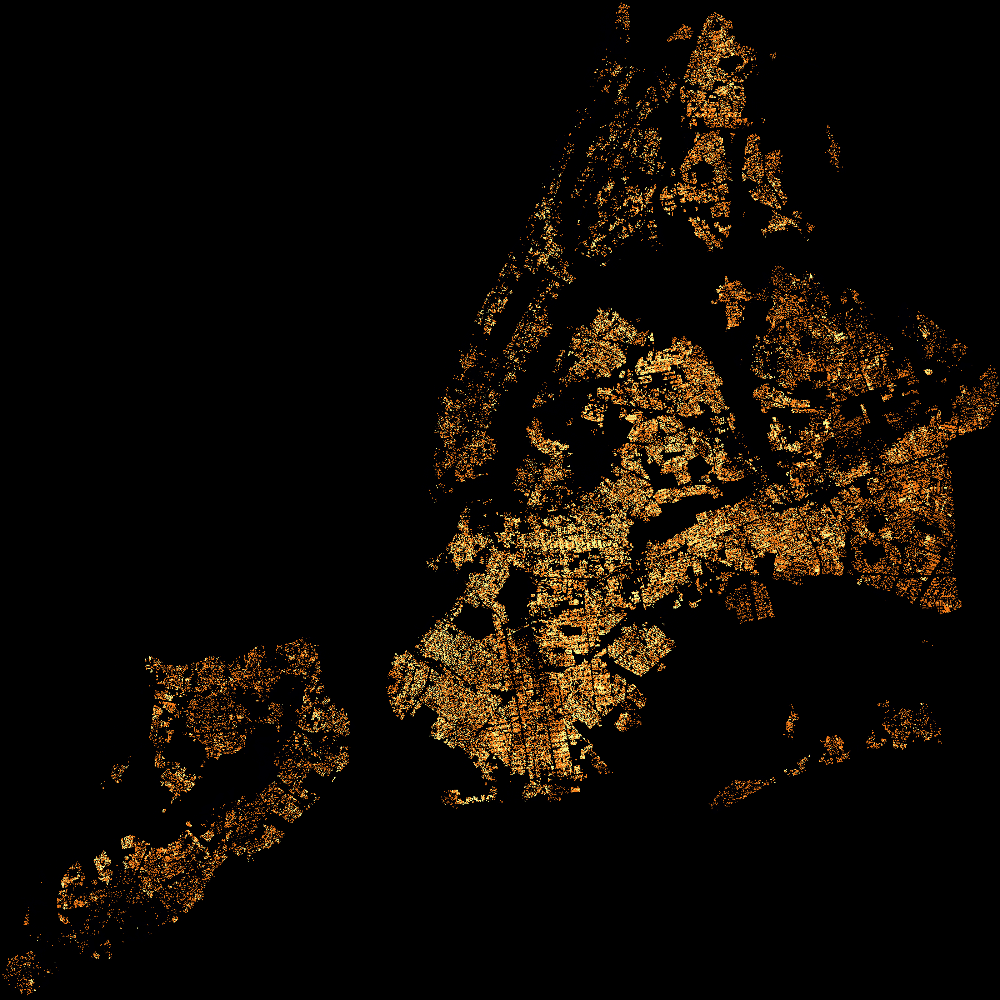

In [25]:
#NewYorkCity = (( -74.29,  -73.69), (40.49, 40.92))
cvs = ds.Canvas(2800, 2800)
agg = cvs.points(my_ny, 'lon', 'lat', ds.count('diff'))
agg2 = cvs.points(my_ny, 'lon', 'lat', ds.count('diff'))
view = tf.shade(agg ,cmap = cm(inferno))
export(tf.spread(view, px=1), 'pretty_colors')

## Attempting to spread

Original image,spread 1px,spread 2px,spread square

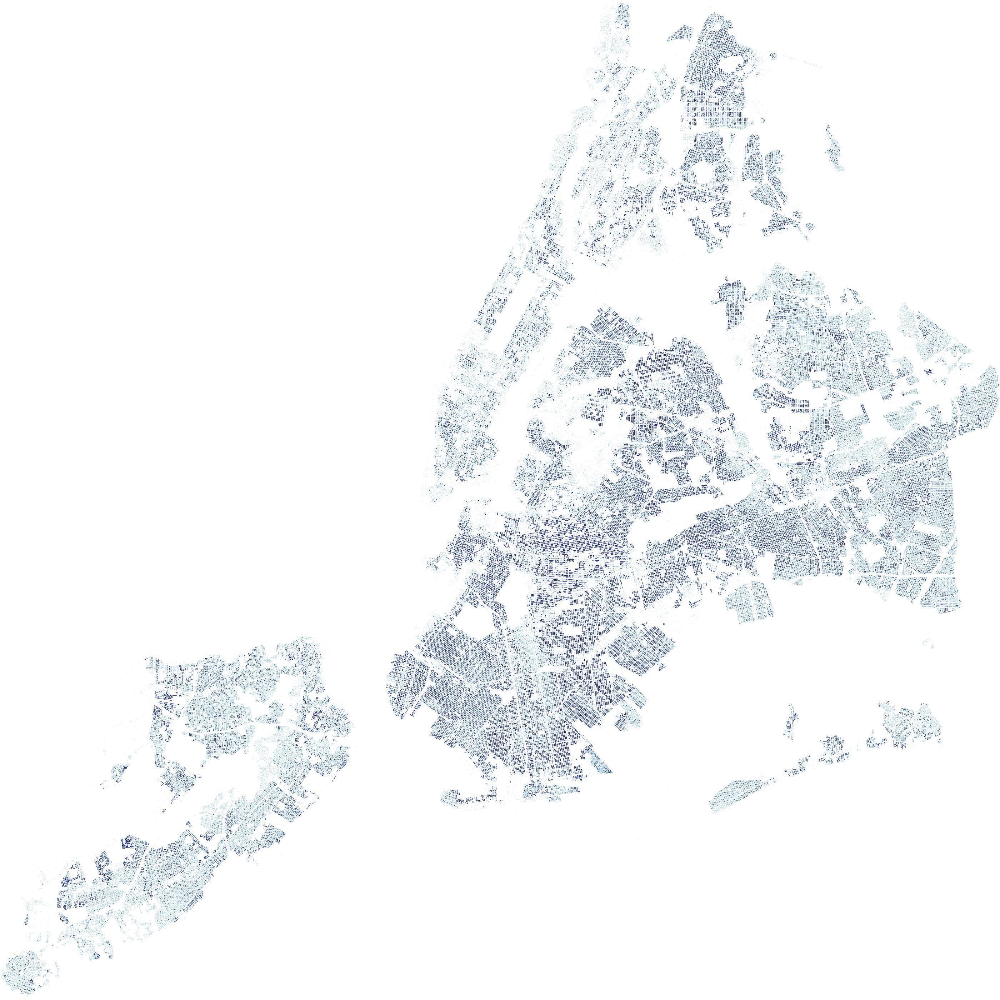
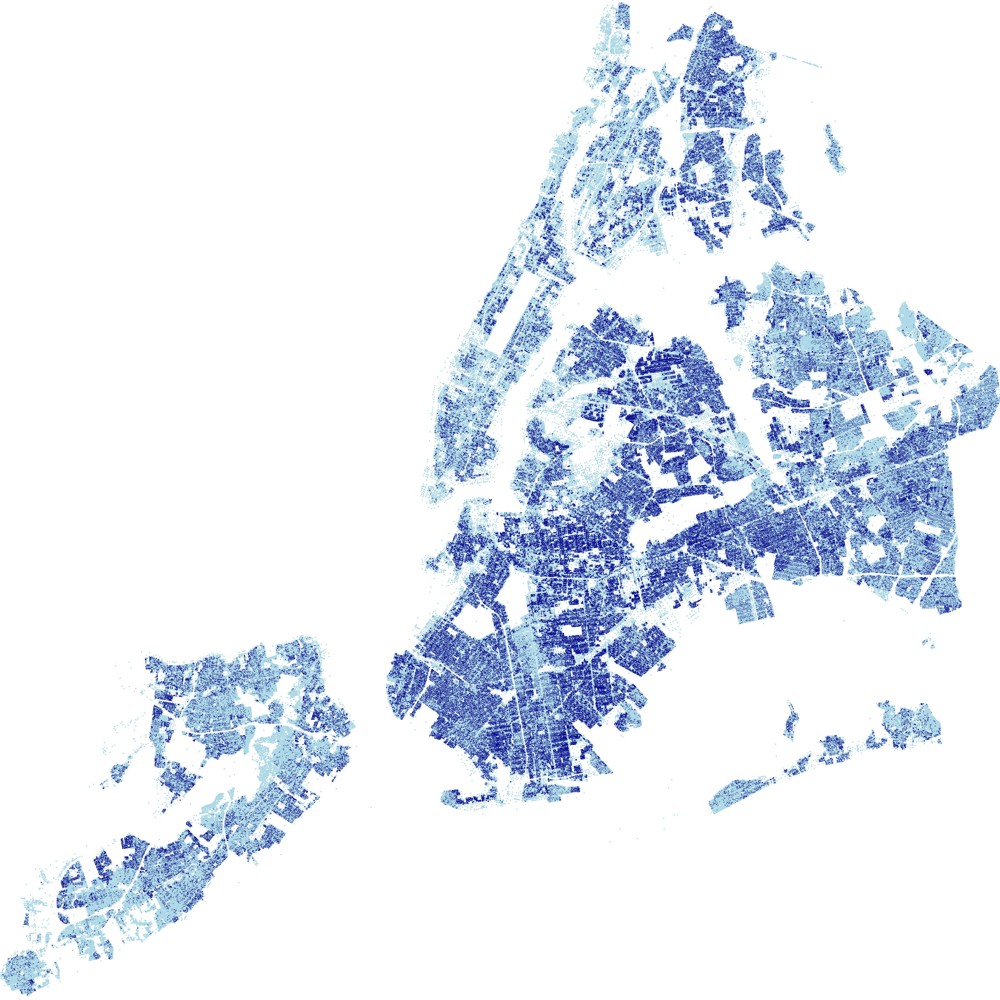
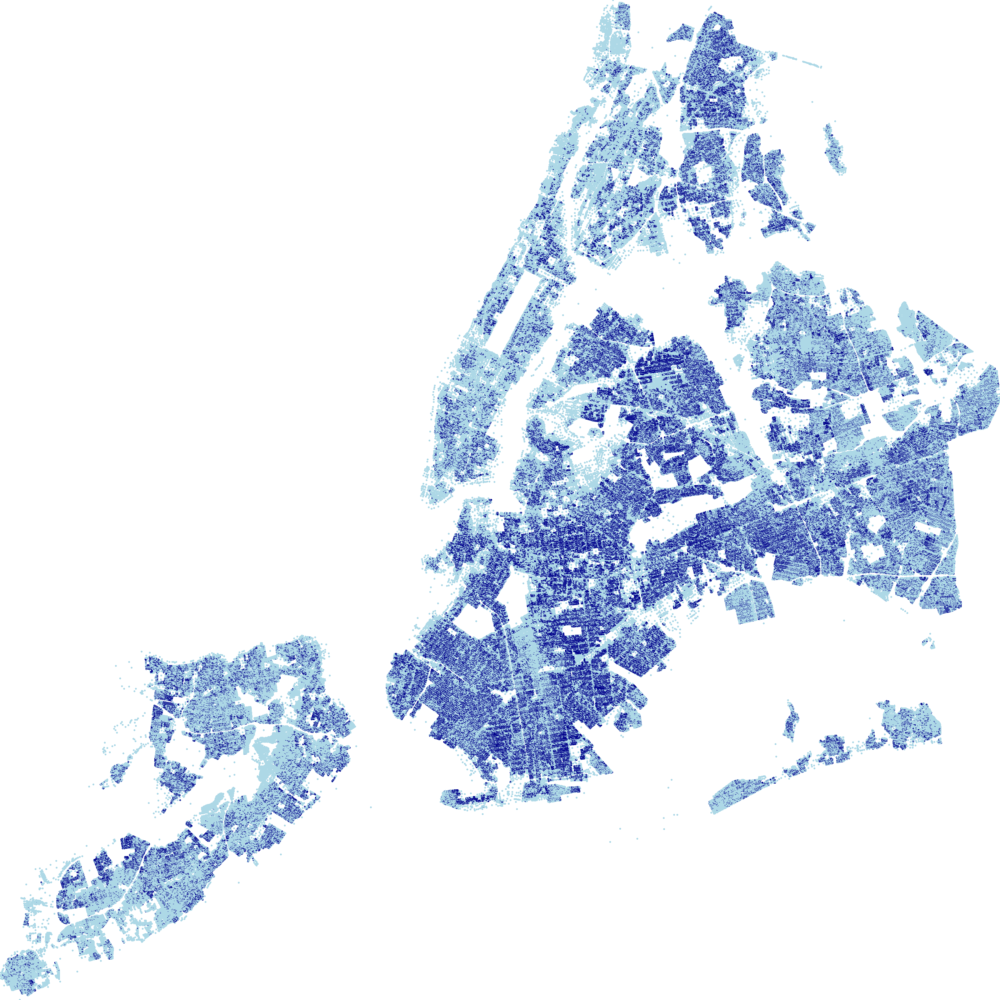
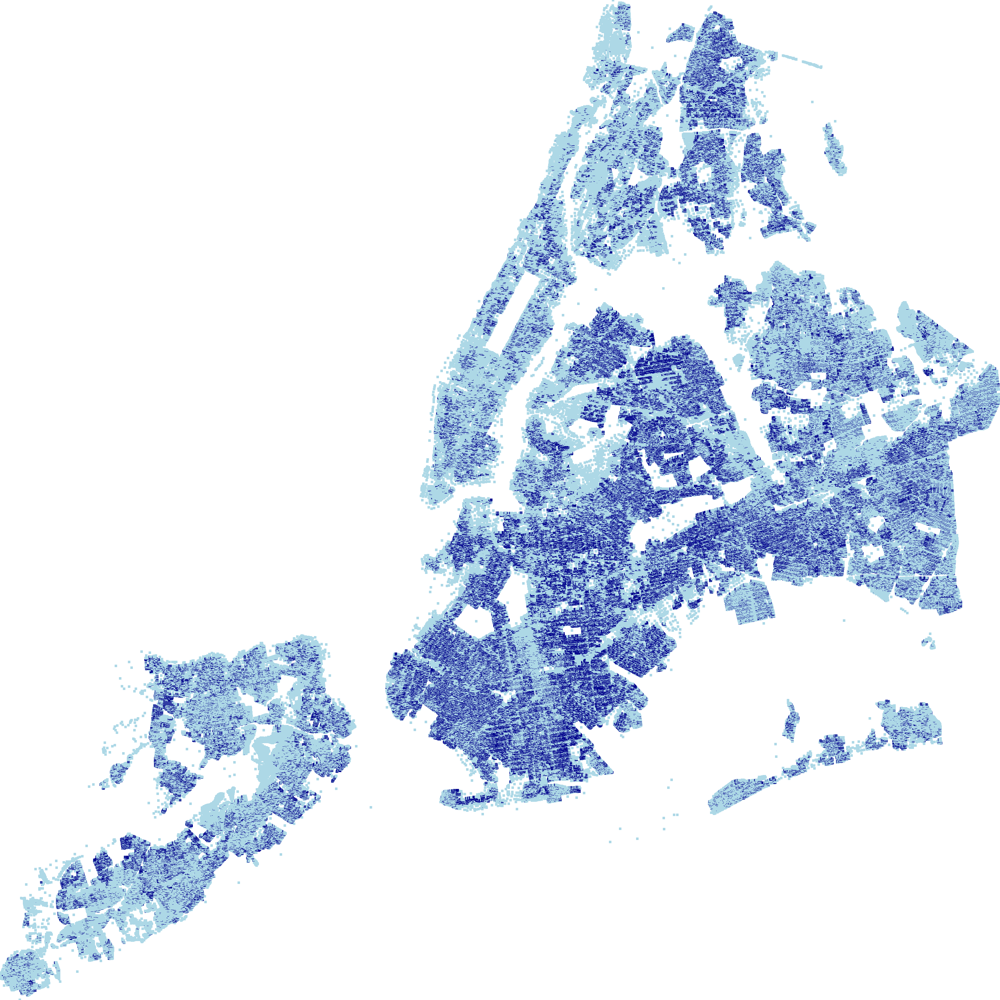

In [26]:
## http://datashader.org/getting_started/2_Pipeline.html
from bokeh.palettes import RdBu9
tf.Images(tf.shade(agg, cmap=["darkred", "yellow"], name="darkred, yellow"),
          tf.shade(agg,cmap=[(230,230,0), "orangered", "#300030"], name="yellow, orange red, dark purple"),
          tf.shade(agg,cmap=RdBu9,name="Bokeh RdBu9"))


img = tf.shade(agg, name="Original image")
tf.Images(img,
          tf.spread(img,       name="spread 1px"),
          tf.spread(img, px=2, name="spread 2px"),
          tf.spread(img, px=3, shape='square', name="spread square"))

"darkred, yellow","yellow, orange red, dark purple",Bokeh RdBu9

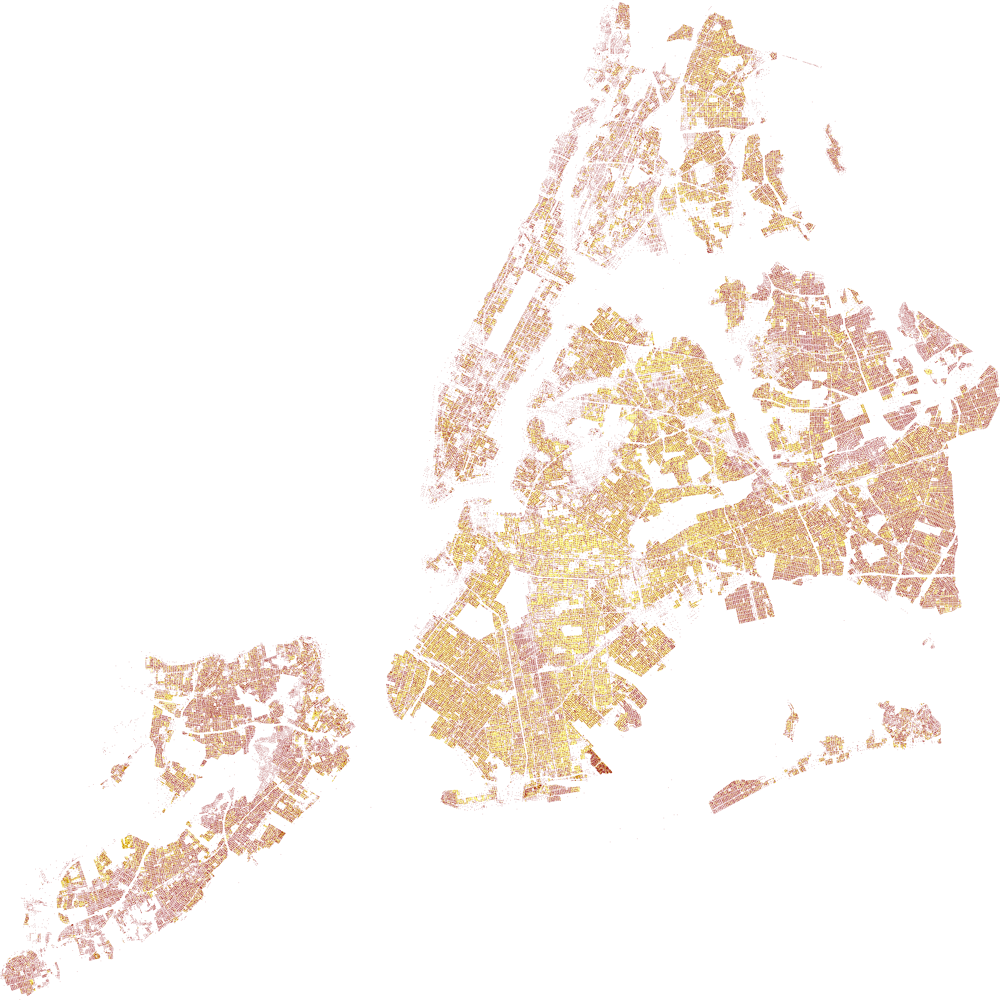
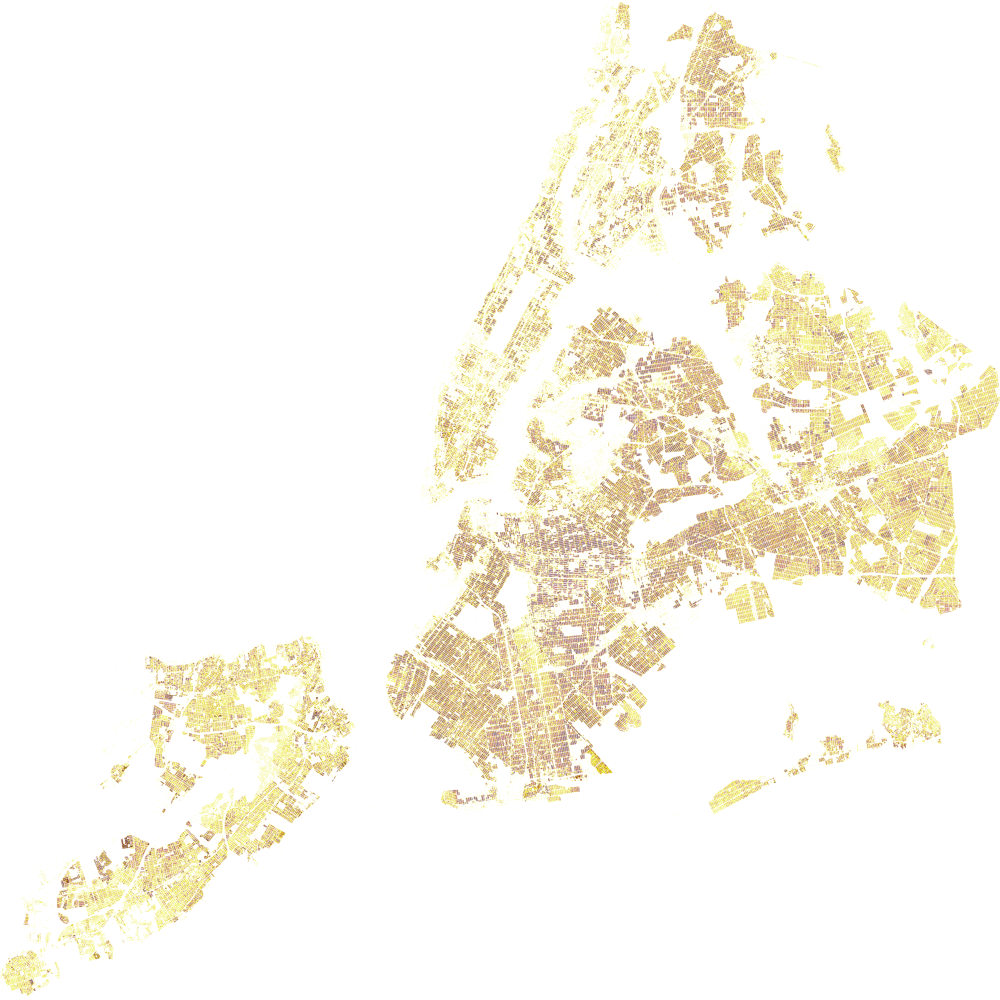
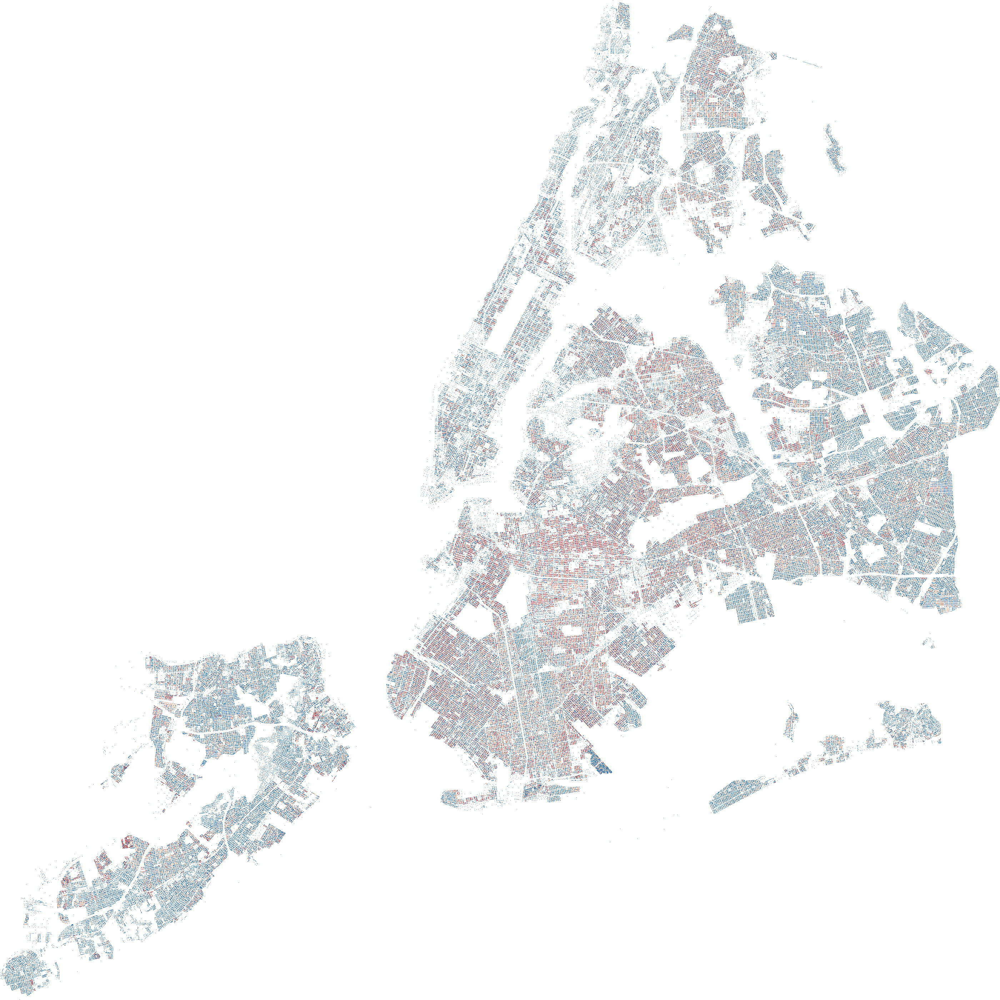

In [27]:
## http://datashader.org/getting_started/2_Pipeline.html
from bokeh.palettes import RdBu9
tf.Images(tf.shade(agg, cmap=["darkred", "yellow"], name="darkred, yellow"),
          tf.shade(agg,cmap=[(230,230,0), "orangered", "#300030"], name="yellow, orange red, dark purple"),
          tf.shade(agg,cmap=RdBu9,name="Bokeh RdBu9"))

## Preliminary results
+ from the graphs above, it would appear much of queens and the brooklyn are underdeveloped

## New approach
+ While the above graph gives us an idea of the ratio difference, which should show us areas that are significantly higher in terms of structural value versus lot value, it isn't using the structure  the article provided. To do that we need to bin the data and set a custom range of colors like expressed in the article
+ we need to cut both values into low, med, high.  I didn't use standard 1 sd, instead I chose 25 and 75 to split the difference between 1 and 2 sd

In [28]:
## to make sure we aren't dividing by 0
my_ny= my_ny.dropna()

## build sq ft asesment  ratios
## clean df
my_ny = pd.DataFrame(ny[['Assessstructure_sqft', 'AssessLand_sqft', 'lat', 'lon']])
my_ny

## Build out categorical data
print(my_ny['AssessLand_sqft'].quantile([.25,.75]))
print(my_ny['Assessstructure_sqft'].quantile([.25,.75]))
my_ny['Assesssland_sqft_cat'] = pd.cut(x=my_ny['AssessLand_sqft'], bins=[0,2.69,5.41,max( my_ny['AssessLand_sqft'])], labels=['low', 'medium', 'high'])
my_ny['Assessstructure_sqft_cat'] = pd.cut(x=my_ny['Assessstructure_sqft'], bins=[0,8.035411,14.956111,max( my_ny['Assessstructure_sqft']+.1)], labels=['low', 'medium', 'high'])
#my_ny["scoring"] =  my_ny['Assesssland_sqft_cat'].map(str) +my_ny['Assessstructure_sqft_cat']

## drop Na
my_ny= my_ny.dropna()

0.25    2.690000
0.75    5.412429
Name: AssessLand_sqft, dtype: float64
0.25     8.035411
0.75    14.956111
Name: Assessstructure_sqft, dtype: float64


In [29]:
## joins categorical data into one 
my_ny['Value'] = my_ny[['Assesssland_sqft_cat', 'Assessstructure_sqft_cat']].apply(lambda x: '-'.join(x), axis=1)
my_ny['Value'] = pd.Categorical(my_ny['Value'])

## Mapping
+ Originally I took mapping color from colorbrewer and then I decided being that we are looking for over built and under built area, I would build out neutral areas(l-l,m-m,h-h) as gray and the over developed areas and under developed as shades of red and blue 


In [30]:
color_map = {
    'low-low': '#fdfbfb',
    'low-medium': '#bdd7e7',
    'low-high': '#2171b5',
    'medium-low': '#fcae91',
    'medium-medium': '#fdfbfb',
    'medium-high': '#6baed6',
    'high-low': '#cb181d',
    'high-medium': '#fb6a4a',
    'high-high': '#fdfbfb'
}

color_map2 = {
    'low-low': '#403d3d',
    'low-medium': '#403d3d',
    'low-high': '#2171b5',
    'medium-low': '#403d3d',
    'medium-medium': '#403d3d',
    'medium-high': '#403d3d',
    'high-low': '#cb181d',
    'high-medium': '#403d3d',
    'high-high': '#403d3d'
}
### Overdeveloped
#bdd7e7
#6baed6
#2171b5

#b3cde3
#8c96c6
#88419d

##under developed
#fcae91
#fb6a4a
#cb181d

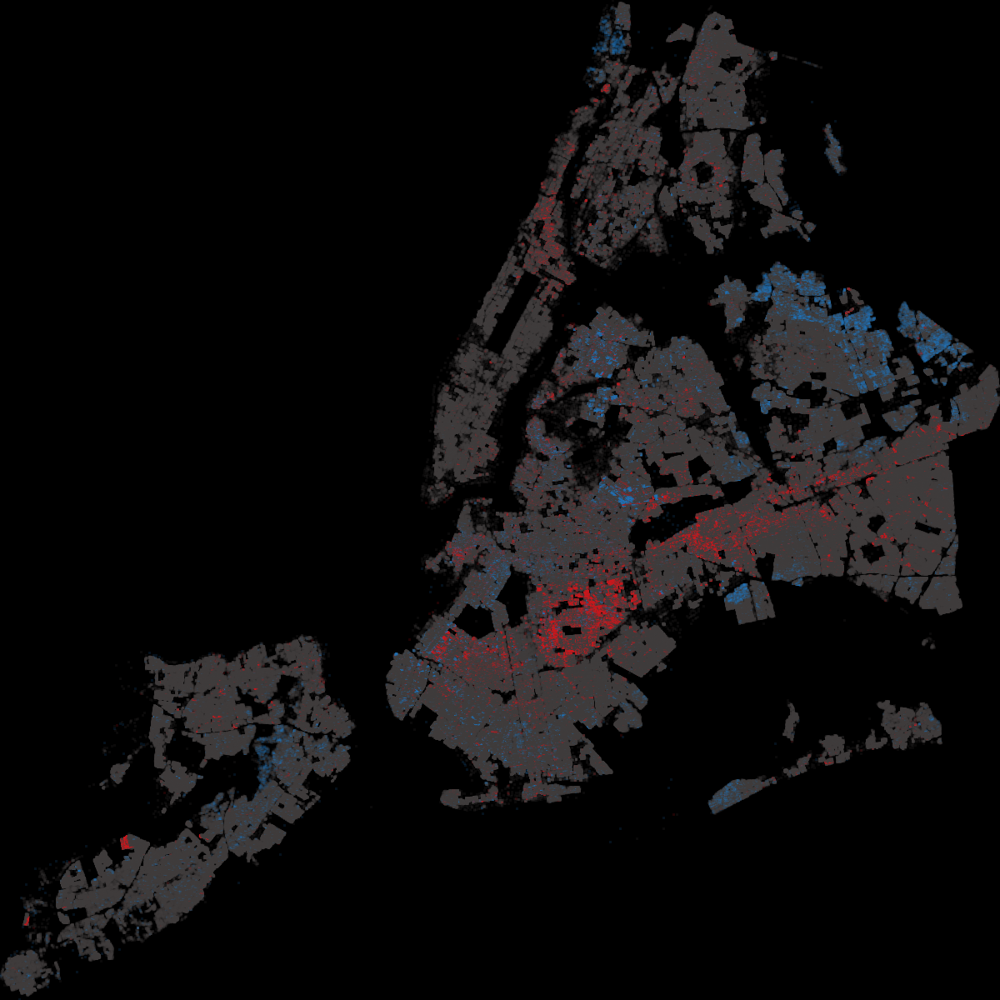

In [31]:
cvs = ds.Canvas(1200, 1200)
agg = cvs.points(my_ny, 'lon', 'lat', ds.count_cat('Value'))
view = tf.shade(agg ,color_key = color_map2)
export(tf.spread(view, px=1), 'pretty_colors')

## Results
+ In red are the areas which are underdeveloped, in blue are the areas which are over developed
+ Seems as though some areas of queens and Brooklyn are still underdeveloped. 
+ Areas like Astoria and the north shore in queens seem to be overdeveloped